# Bayesian Optimisation: ERK single-pulse dose-response (v6 -- SALES PITCH: 5% power, relaxed baseline filter, log dose, EC50 posteriors, 0 ms control)

Successor to [bo_erk_dose_response_v3.ipynb](bo_erk_dose_response_v3.ipynb).
Design fixed after the v3 post-mortem
([pitch & critique](bo_erk_dose_response_v3_pitch_and_critique.ipynb)) and the
readout replay
([peak-amplitude replay](bo_erk_dose_response_v3_peak_amplitude_replay.ipynb)).

**System.** optoEGFR (light-gated EGFR-type optogenetic RTK) drives ERK -- a
node of the MAPK cascade (RAS-RAF-MEK-ERK) -- read live by an ERK-KTR
translocation biosensor (`cnr` = cytosolic/nuclear ratio). A single light
pulse of variable `pulse_duration` is the dose.

### What changed vs v3 (and why)

1. **Primary readout = peak amplitude** (`mean_peak_amp` = mean over surviving
   cells of `max(cnr - baseline)`), fit online per phase. Peak reports the
   instantaneous gain of the ultrasensitive MEK->ERK step *before* slow
   negative feedback (DUSP, ERK->SOS) engages, so it has a real ceiling
   (ERK pool / receptor occupancy) and a dose-response that *can* saturate.
   AUC convolves amplitude with a non-saturating duration/adaptation integral
   and climbs ~log(dose) forever -- that is why v3 could not identify an EC50.
   `mean_delta_auc` is still computed and logged every phase, just not fitted.

2. **Honest model selection restored** (v3 deleted it by committing to Hill).
   Per task, gpax.hypo eps-greedy rotates over a candidate set:
   * peak: **{ in-range Hill, exponential, power_law }**
   * frac: **{ in-range Hill, exponential }** (a recruited fraction must saturate)
   `power_law` (`a*d^b`) is the non-saturating escape the agent can *declare a
   winner* -- it reports "non-saturating, exponent b" instead of faking an EC50.
   The **in-range Hill** draws its half-max `K` from `Beta(2,2)` mapped onto the
   measured dose range, with zero density at the boundary -- so `K` cannot run
   off to 5000 ms (the v3 pathology). If the data does not saturate, this Hill
   fits badly and eps-greedy rotates away from it.

3. **frac down-weighted** in the joint acquisition (`frac_acq_weight` 0.3 -> 0.15)
   so the ceilinged recruitment fraction stops pulling the MaxVar sampler.

4. **Cell-count floor** on the per-cell baseline filter (`min_valid_cells = 20`,
   was an effective 3) -- kills the 3-9 cell FOV means that were pure noise.

5. **optoRTK expression stratified, not just marginalised.** `optortk_expression`
   stays a GP axis; acquisition marginalises over a *uniform* low->high
   expression grid so doses reduce uncertainty evenly across strata, and
   reporting slices the surface at expression percentiles (it explains ~30% of
   the non-dose residual). `baseline_cnr` is kept as a covariate (its
   surviving-cell FOV mean still carries residual signal; read its effect
   predictively, not causally).

6. **Stimulation power is a BLOCKING factor, not a GP axis.** Power is
   non-linear, so we never multiply it with duration (no reciprocity
   assumption). We run one v4 agent per power level **{10, 100}** (each on its
   own distinct wells, no repeats) and compare the per-power peak dose-response
   curves. If reciprocity holds, the curves collapse when replotted against
   `duration x power`; if not, blocking already protected us. Duration axis:
   **0 - 5000 ms**.

7. **Finish criterion is *indicated, not enforced*.** Each phase reports a
   convergence diagnostic (peak-curve stability + the `frac` half-recruitment
   dose -- the one EC50 that is always identifiable), but the run uses the
   **full FOV budget**; `is_converged` is informational only.


## Imports + gpax/numpyro compatibility shim

In [1]:
import os
import time
import logging
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

os.environ["JAX_LOG_COMPILES"] = "0"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import jax
import jax.numpy as jnp

jax.config.update("jax_log_compiles", False)
for _name in list(logging.Logger.manager.loggerDict):
    if "jax" in _name or "absl" in _name:
        logging.getLogger(_name).setLevel(logging.WARNING)

# gpax/numpyro shim: numpyro >= 0.20 removed haiku; gpax 0.1.9 imports it
# eagerly via viDKL. We only use ExactGP -- stub it so import succeeds.
import numpyro.contrib.module as _ncm


def _haiku_unavailable(*_args, **_kwargs):
    raise NotImplementedError("viDKL unavailable with numpyro >= 0.20.")


if not hasattr(_ncm, "random_haiku_module"):
    _ncm.random_haiku_module = _haiku_unavailable
if not hasattr(_ncm, "haiku_module"):
    _ncm.haiku_module = _haiku_unavailable

import numpyro
import numpyro.distributions as dist

# Enable float64 BEFORE any gpax fit (gpax 0.1.9 float32 Cholesky -> NaN).
import gpax.utils as _gpax_utils

_gpax_utils.enable_x64()

from faro.core.data_structures import PowerChannel, SegmentationMethod
from faro.core.controller import Controller
from faro.core.pipeline import ImageProcessingPipeline
from faro.agents.bo_optimization import BO_Parameter, BO_Objective, BO_Covariate
import faro.core.utils as utils

## Microscope & pipeline hardware (same layout as v3)

In [2]:
from faro.microscope.pertzlab.jungfrau import Jungfrau

mic = Jungfrau()
mic.mmc.setChannelGroup("TTL_ERK")
mic.mmc.setProperty("TIPFSStatus", "State", "On")

In [3]:
import napari
from napari_micromanager import MainWindow

viewer = napari.Viewer()
mm_wdg = MainWindow(viewer)
mm_wdg._mmc = mic.mmc
viewer.window.add_dock_widget(mm_wdg)

## Wells (serpentine over the plate)

In [3]:
WELLS = []
START_COL = 2
END_COL = 12
for i, row in enumerate("ABCDEFGH"):
    cols = (
        range(START_COL, END_COL + 1)
        if i % 2 == 0
        else range(END_COL, START_COL - 1, -1)
    )
    WELLS.extend(f"{row}{c}" for c in cols)
print(f"{len(WELLS)} wells available")

88 wells available


## Experiment configuration

Per-FOV protocol unchanged from v3: 5 frame baseline -> 1 stim frame ->
25 frame observation (1 frame/min). The only experimental change is the
**duration axis (0-5000 ms)** and the **power blocking levels**.

**Well budget across blocks.** We run one BO per power level, and each block
gets its **own distinct slice** of the well list (`cycle_wells=False`), so no
well is ever stimulated twice across the experiment. With 2 blocks x 6 phases
x 6 wells = 72 wells, this fits the plate without repeats. Adjust `N_PHASES` /
power levels to your plate and time budget.

In [4]:
# --- Timing ---
TIME_BETWEEN_TIMESTEPS = 60  # s (1 frame/min)
N_FRAMES_BASELINE = 5
N_FRAMES_OBSERVATION = 25
N_FRAMES = N_FRAMES_BASELINE + 1 + N_FRAMES_OBSERVATION  # 31
STIM_FRAME = N_FRAMES_BASELINE

# --- Plate calibration ---
PLATE_CALIBRATION_PATH = r"./calib_plate_96.json"  # <-- UPDATE

# --- FOV finder ---
FOV_BORDER_UM = 1250
FOV_MIN_DISTANCE_UM = 750.0
FOV_MIN_CELLS = 30
FOV_N_CANDIDATES_PER_WELL = 12

# --- Phase layout: 18 FOVs/phase = 3 conditions x 2 wells x 3 FOVs ---
N_CONDITIONS_PER_ITER = 3
WELLS_PER_CONDITION = 2
FOVS_PER_WELL = 3
N_WELLS_PER_PHASE = N_CONDITIONS_PER_ITER * WELLS_PER_CONDITION  # 6
FOVS_PER_CONDITION = WELLS_PER_CONDITION * FOVS_PER_WELL  # 6
N_FOVS = N_CONDITIONS_PER_ITER * FOVS_PER_CONDITION  # 18
N_PHASES = 7

# --- Power blocking levels (one full duration-BO per level) ---
# Each block gets its OWN distinct slice of wells (no well is stimulated
# twice across the experiment), so the plate must hold
# len(POWER_LEVELS) * N_PHASES * N_WELLS_PER_PHASE wells.
POWER_LEVELS = [5, 10]
WELLS_PER_BLOCK = N_PHASES * N_WELLS_PER_PHASE  # 6 phases x 6 wells = 36

# --- Dose axis (v5: LOG-spaced; the steep response lives in ~200-500 ms) ---
# A log grid puts comparable candidate counts in every decade, so the MaxVar
# sampler actually visits the steep knee instead of piling into the flat
# high-dose tail (v4 placed only 1 of 21 doses in 200-500 ms). Full range
# [10, 5000] ms keeps the high-dose plateau in view so the agent can SEE
# saturation and reject the (infeasible) non-saturating power_law candidate.
# NB: a literal 0 ms dose cannot sit on a log axis (log(0) = -inf); run the
# zero-dose control as separate control FOVs (stim exposure 0 is now skipped
# cleanly, no camera-min error) and overlay it on a symlog axis.
DURATION_BOUNDS = (10.0, 5000.0)
DURATION_LOG_SCALE = True
DURATION_N_GRID = 60  # number of log-spaced candidate doses
DURATION_SPACING = 25.0  # unused on a log axis; kept for back-compat
_g = np.geomspace(*DURATION_BOUNDS, DURATION_N_GRID)
print(
    f"Duration axis: LOG [{DURATION_BOUNDS[0]:.0f}, {DURATION_BOUNDS[1]:.0f}] ms, "
    f"{DURATION_N_GRID} levels "
    f"({int(((_g>=200)&(_g<500)).sum())} in 200-500 ms, "
    f"{int((_g>=1000).sum())} above 1000 ms)"
)

# --- Storage ---
base_path = r"E:\Alex"
experiment_base = "2026-06-07_bo_erk_dose_response_v6_pitch_power5"


def block_path(power):
    return os.path.join(base_path, f"{experiment_base}_power{int(power)}")


# --- Imaging + optocheck channels (every-frame / last-frame; power fixed) ---
imaging_channels = (
    PowerChannel(config="miRFP", exposure=150, group="TTL_ERK", power=95),
    PowerChannel(config="mScarlet3", exposure=150, group="TTL_ERK", power=95),
)
optocheck_channel = PowerChannel(
    config="mCitrine", exposure=600, group="TTL_ERK", power=95
)


def make_stim_channel(power):
    """Stimulation channel for one power block (exposure overridden per dose)."""
    return PowerChannel(
        config="CyanStim", exposure=100, group="TTL_ERK", power=int(power)
    )


_wells_needed = len(POWER_LEVELS) * WELLS_PER_BLOCK
assert _wells_needed <= len(WELLS), (
    f"need {_wells_needed} distinct wells "
    f"({len(POWER_LEVELS)} blocks x {WELLS_PER_BLOCK}) but only {len(WELLS)} available"
)
print(
    f"{len(POWER_LEVELS)} power blocks {POWER_LEVELS} x {N_PHASES} phases x "
    f"{N_FOVS} FOVs = {len(POWER_LEVELS) * N_PHASES * N_FOVS} total FOVs"
)
print(
    f"Wells: {_wells_needed}/{len(WELLS)} used, {WELLS_PER_BLOCK} distinct per block "
    f"(no well stimulated twice)"
)

Duration axis: LOG [10, 5000] ms, 60 levels (9 in 200-500 ms, 16 above 1000 ms)
2 power blocks [5, 10] x 7 phases x 18 FOVs = 252 total FOVs
Wells: 84/88 used, 42 distinct per block (no well stimulated twice)


## Segmentation (shared Cellpose) -- pipeline/writer are built per block

In [5]:
from faro.stimulation.base import StimWholeFOV
from faro.tracking.trackpy import TrackerTrackpy
from faro.feature_extraction.erk_ktr import FE_ErkKtr
from faro.feature_extraction.optocheck import OptoCheckFE
from faro.segmentation.cellpose_v4 import CellposeV4
from faro.core.writers import OmeZarrWriter

segmentator = CellposeV4(
    custom_model_path=r"E:\models\cellpose\LifeActH2B_mixed_with_only_H2B_v1",
    min_size=100,
)


def make_pipeline_and_writer(path):
    pipeline = ImageProcessingPipeline(
        storage_path=path,
        segmentators=[
            SegmentationMethod(
                name="labels",
                segmentation_class=segmentator,
                use_channel=0,
                save_tracked=True,
            )
        ],
        feature_extractor=FE_ErkKtr("labels"),
        tracker=TrackerTrackpy(search_range=50),
        stimulator=StimWholeFOV(),
        feature_extractor_ref=OptoCheckFE(used_mask="labels"),
    )
    writer = OmeZarrWriter(storage_path=path)
    return pipeline, writer

## v4 candidate mean functions

The agent ships the v4 candidate sets by default; we import them only to print
and to confirm the families. The **in-range Hill** prior keeps `K` inside the
measured dose range; **power_law** is the non-saturating escape.

In [6]:
from faro.agents.two_task_dose_response_v4 import (
    TwoTaskDoseResponseV4BO,
    V4_CANDIDATES_PEAK,
    V4_CANDIDATES_FRAC,
)
from faro.agents.two_task_dose_response import _inv_logit

print(
    f"peak candidates : {list(V4_CANDIDATES_PEAK)}  (hill=in-range, + non-saturating power_law)"
)
print(
    f"frac candidates : {list(V4_CANDIDATES_FRAC)}  (saturating only -- a fraction must plateau)"
)

peak candidates : ['hill', 'exponential', 'power_law']  (hill=in-range, + non-saturating power_law)
frac candidates : ['hill', 'exponential']  (saturating only -- a fraction must plateau)


## Build + run one power block

`run_power_block(power)` builds a fresh FOV finder, v4 agent, pipeline, writer
and controller for one power level and runs the full phase budget. It returns
the fitted agent so we can inspect each block afterwards.

The agent reports a convergence diagnostic each phase (peak-curve stability +
frac half-recruitment dose) but **does not stop early** -- the full FOV budget
is always used.

In [7]:
from faro.agents import FOVFinderAgent, ComposedAgent


def build_agent(power, path):
    bo_params = [
        BO_Parameter(
            name="pulse_duration",
            bounds=DURATION_BOUNDS,
            spacing=DURATION_SPACING,
            log_scale=DURATION_LOG_SCALE,
            n_grid=DURATION_N_GRID,
        )
    ]
    bo_covariates = [
        BO_Covariate(name="optortk_expression", log_scale=True),
        BO_Covariate(name="baseline_cnr"),
    ]
    # Primary objective metric IS peak amplitude in v4.
    bo_objective = BO_Objective(name="mean_peak_amp", goal="maximize")

    agent = TwoTaskDoseResponseV4BO(
        storage_path=path,
        n_frames_baseline=N_FRAMES_BASELINE,
        n_frames_observation=N_FRAMES_OBSERVATION,
        time_between_timesteps=TIME_BETWEEN_TIMESTEPS,
        imaging_channels=imaging_channels,
        stim_channel=make_stim_channel(power),
        optocheck_channel=optocheck_channel,
        min_track_fraction=0.8,
        max_baseline_cnr=0.95,  # v6: was 0.8 -- basal CNR centres ~0.87,
        #                                  0.8 cut ~80% of cells (46% FOV survival);
        #                                  0.95 keeps the bulk, still drops no-headroom cells
        save_checkpoints=True,
        plot_live=True,
        parameters_to_optimize=bo_params,
        objective_metric=bo_objective,
        bo_covariates=bo_covariates,
        n_iterations=N_PHASES,
        n_conditions_per_iter=N_CONDITIONS_PER_ITER,
        n_initial_phases=1,
        n_cov_samples=40,
        ei_num_samples=8,
        initial_exploration_cap=None,
        verbose=True,
        penalty="inverse_distance",
        penalty_factor=1.0,
        batch_penalty_factor=10,
        # --- v4 model-selection knobs ---
        eps_greedy_eps=0.3,
        n_warmup_phases=2,  # both candidates fit during warmup
        frac_acq_weight=0.43,  # ~70/30 peak:frac in z-scored acq
        #                                   (w/(1+w)=0.3 frac share). Peak stays
        #                                   dominant; both readouts come from the
        #                                   same FOVs so this only nudges dose choice
        lengthscale_prior_dist=dist.Uniform(0.1, 5.0),
        peak_ratio=1.5,  # near data-optimum (ROC Youden ~1.4-1.5x)
        peak_min_consecutive_frames=3,  # was 2: ~halves low-dose false positives
        response_window_frames=12,  # analyse only frames 6..17 post-stim --
        #                                   captures the ~7-9 min ERK-KTR transient
        #                                   peak; the full 25-frame tail ~doubles
        #                                   low-dose responder false positives
        gp_kernel="Matern",
        gp_num_warmup=400,
        gp_num_samples=800,
        rng_seed=42,
        # --- v4-specific ---
        min_valid_cells=10,  # cell-count floor (v3 had 3)
        uniform_expression_grid=True,  # even coverage across expression strata
        expression_covariate="optortk_expression",
        stop_rms_tol=0.05,  # convergence INDICATOR only
        stop_patience=2,
    )
    return agent


def run_power_block(power):
    path = block_path(power)
    os.makedirs(path, exist_ok=True)
    pipeline, writer = make_pipeline_and_writer(path)

    # Distinct well slice for this block -- no overlap with other blocks.
    blk = POWER_LEVELS.index(power)
    block_wells = WELLS[blk * WELLS_PER_BLOCK : (blk + 1) * WELLS_PER_BLOCK]
    if len(POWER_LEVELS) == 1:
        # single block: hand the finder the spare wells too as replacement
        # headroom for replace_short_wells (last 2 reserved for the 0 ms control)
        block_wells = WELLS[:-2]
    print(
        f"  block {power}: wells {block_wells[0]}..{block_wells[-1]} "
        f"({len(block_wells)} distinct)"
    )

    fov_finder = FOVFinderAgent(
        microscope=mic,
        well_plate_plan=PLATE_CALIBRATION_PATH,
        wells=block_wells,
        wells_per_phase=N_WELLS_PER_PHASE,
        fovs_per_well=FOVS_PER_WELL,
        n_candidates_per_well=FOV_N_CANDIDATES_PER_WELL,
        border_um=FOV_BORDER_UM,
        min_distance_um=FOV_MIN_DISTANCE_UM,
        min_cells=30,
        max_cells=100,
        imaging_channels=(imaging_channels[0],),
        segmentator=segmentator,
        seg_channel_index=0,
        random_seed=None,
        selection_mode="farthest_point",
        cycle_wells=True,
        replace_short_wells=True,  # skip a well that can't supply
        max_well_replacements=20,  # fovs_per_well valid FOVs; try a fresh well
        verbose=False,
        z=None,
    )

    agent = build_agent(power, path)
    composed = ComposedAgent(
        inner_agent=agent, pre_phase_agents=[fov_finder], n_phases=N_PHASES
    )
    ctrl = Controller(mic, pipeline, writer=writer, agent=composed)

    print("=" * 72)
    print(f"POWER BLOCK {power}  ->  {path}")
    print(
        f"  grid: {len(agent.x_total_linespace)} durations | "
        f"acq: z(peak) + {agent.frac_acq_weight}*z(frac) + inverse-distance repulsion"
    )
    print("=" * 72)

    # Disconnect napari live view so it does not interfere with acquisition.
    try:
        mm_wdg._core_link.cleanup()
    except Exception:
        pass

    composed.run()
    utils.generate_exp_data_from_tracks(path)
    return agent

### Run all power blocks

Runs sequentially. Stop the kernel between blocks if you need to reload the
plate. `agents` keeps every fitted block for the analysis below.

Directory E:\Alex\2026-06-07_bo_erk_dose_response_v6_pitch_power5_power5\tracks already exists
  block 5: wells A2..D4 (42 distinct)
POWER BLOCK 5  ->  E:\Alex\2026-06-07_bo_erk_dose_response_v6_pitch_power5_power5
  grid: 60 durations | acq: z(peak) + 0.43*z(frac) + inverse-distance repulsion

=== ComposedAgent: phase 1/7 ===
[FOVFinderAgent] Phase 0 — selected FOVs:
    A2_0000: 94 cells
    A2_0001: 34 cells
    A2_0002: 96 cells
    A3_0000: 52 cells
    A3_0001: 41 cells
    A3_0002: 34 cells
    A4_0000: 38 cells
    A4_0001: 67 cells
    A4_0002: 50 cells
    A5_0000: 76 cells
    A5_0001: 76 cells
    A5_0002: 31 cells
    A6_0000: 83 cells
    A6_0001: 31 cells
    A6_0002: 42 cells
    A7_0000: 36 cells
    A7_0001: 31 cells
    A7_0002: 70 cells
=== Phase 0: initial batch 1/1 ===
  Condition 0: {'pulse_duration': np.float64(16.932702245413264)}
  Condition 1: {'pulse_duration': np.float64(5000.000000000004)}
  Condition 2: {'pulse_duration': np.float64(290.96994901031667)}
 

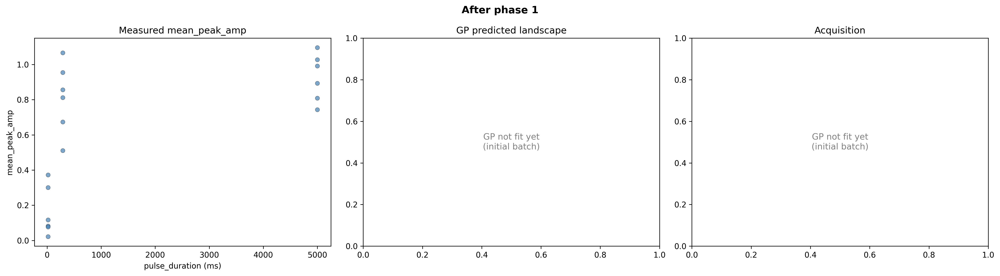


=== ComposedAgent: phase 2/7 ===
[FOVFinderAgent] Phase 1 — selected FOVs:
    A8_0000: 39 cells
    A8_0001: 63 cells
    A8_0002: 35 cells
    A9_0000: 95 cells
    A9_0001: 86 cells
    A9_0002: 32 cells
    A10_0000: 47 cells
    A10_0001: 65 cells
    A10_0002: 74 cells
    A11_0000: 66 cells
    A11_0001: 38 cells
    A11_0002: 42 cells
    A12_0000: 47 cells
    A12_0001: 97 cells
    A12_0002: 31 cells
    B12_0000: 93 cells
    B12_0001: 56 cells
    B12_0002: 42 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: warmup phase 1/2 -- fitting all 3 candidates]
      hill: obj=0.0813, log_evidence=-6.959
      exponential: obj=0.0841, log_evidence=-3.870
      power_law: obj=0.0912, log_evidence=-3.659
    [auc: warmup winner='hill', obj=0.0813]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: warmup phase 1/2 -- fitting all 2 candidates]
      hill: obj=0.1659, log_evidence=-11.465
      exponential: obj=0.1683, log_ev

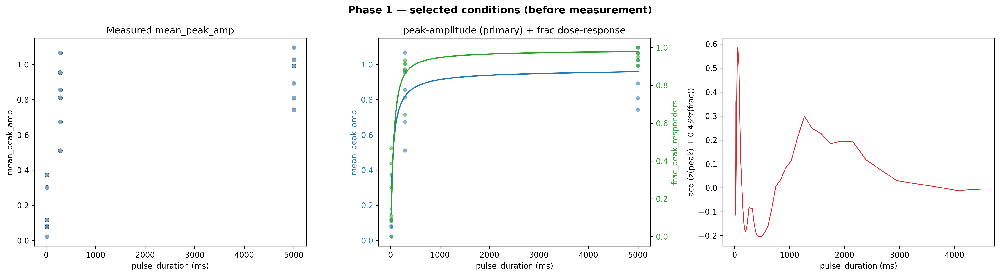

  Created 558 events for phase 1
    Cond 0 (FOVs 18-23): pulse_duration=60ms
    Cond 1 (FOVs 24-29): pulse_duration=1271ms
    Cond 2 (FOVs 30-35): pulse_duration=10ms
  optoRTK retry summary: 1/1 recovered after re-read


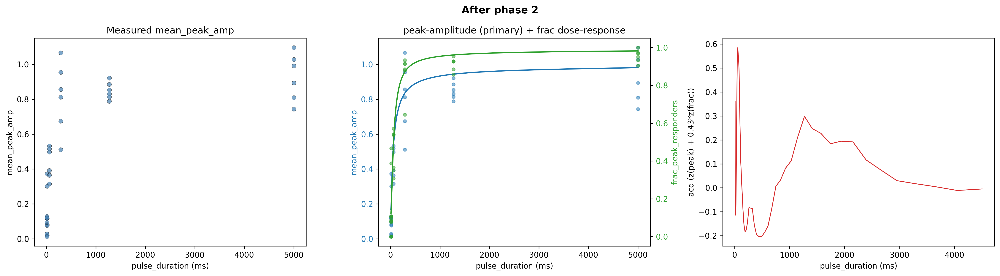

  [v4 convergence] peak-curve RMS change=n/a (tol 0.05), family='hill', frac half-recruitment dose=82 ms, converged=False

=== ComposedAgent: phase 3/7 ===
[FOVFinderAgent] Phase 2 — selected FOVs:
    B11_0000: 34 cells
    B11_0001: 77 cells
    B11_0002: 64 cells
    B10_0000: 48 cells
    B10_0001: 55 cells
    B10_0002: 57 cells
    B9_0000: 48 cells
    B9_0001: 84 cells
    B9_0002: 44 cells
    B8_0000: 99 cells
    B8_0001: 58 cells
    B8_0002: 69 cells
    B7_0000: 88 cells
    B7_0001: 71 cells
    B7_0002: 87 cells
    B6_0000: 50 cells
    B6_0001: 97 cells
    B6_0002: 56 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: warmup phase 2/2 -- fitting all 3 candidates]
      hill: obj=0.0240, log_evidence=+2.469
      exponential: obj=0.0270, log_evidence=+4.553
      power_law: obj=0.0267, log_evidence=+7.277
    [auc: warmup winner='hill', obj=0.0240]
    [auc: WARMUP COMPLETE -- win frequencies: hill=1.00, exponential=0.00, power_law=0.00]
  

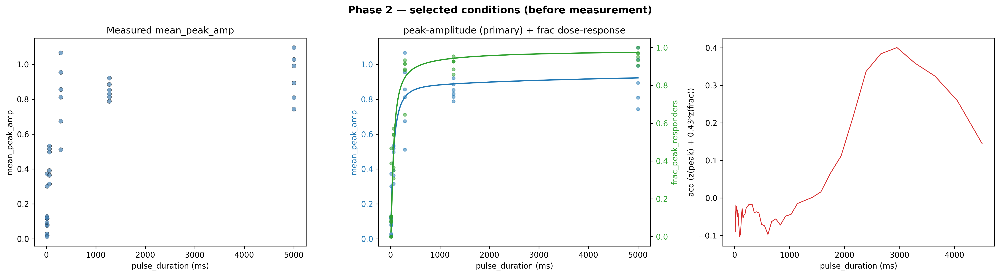

  Created 558 events for phase 2
    Cond 0 (FOVs 36-41): pulse_duration=2953ms
    Cond 1 (FOVs 42-47): pulse_duration=4050ms
    Cond 2 (FOVs 48-53): pulse_duration=2153ms
  optoRTK retry summary: 1/1 recovered after re-read


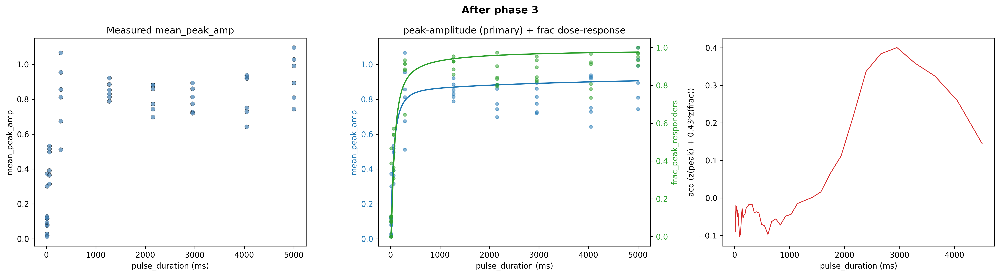

  [v4 convergence] peak-curve RMS change=0.073 (tol 0.05), family='hill', frac half-recruitment dose=113 ms, converged=False

=== ComposedAgent: phase 4/7 ===
[FOVFinderAgent] Phase 3 — selected FOVs:
    B5_0000: 36 cells
    B5_0001: 55 cells
    B5_0002: 77 cells
    B4_0000: 31 cells
    B4_0001: 69 cells
    B4_0002: 53 cells
    B2_0000: 94 cells
    B2_0001: 62 cells
    B2_0002: 59 cells
    C2_0000: 31 cells
    C2_0001: 35 cells
    C2_0002: 72 cells
    C3_0000: 83 cells
    C3_0001: 45 cells
    C3_0002: 100 cells
    C4_0000: 45 cells
    C4_0001: 47 cells
    C4_0002: 73 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+1.00(n=2), exponential=+0.00(n=2), power_law=+0.00(n=2))]
    [auc: obj=0.0182 (prev_finite=0.0240) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'exponential'  (hill=+0.50(n=2), exponential=+0.50(n=2))]
    [frac: obj=0.0524 (prev_finit

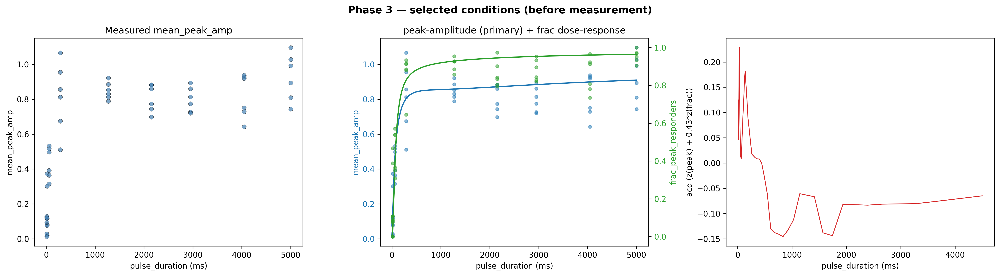

  Created 558 events for phase 3
    Cond 0 (FOVs 54-59): pulse_duration=32ms
    Cond 1 (FOVs 60-65): pulse_duration=139ms
    Cond 2 (FOVs 66-71): pulse_duration=23ms
  optoRTK retry summary: 1/1 recovered after re-read


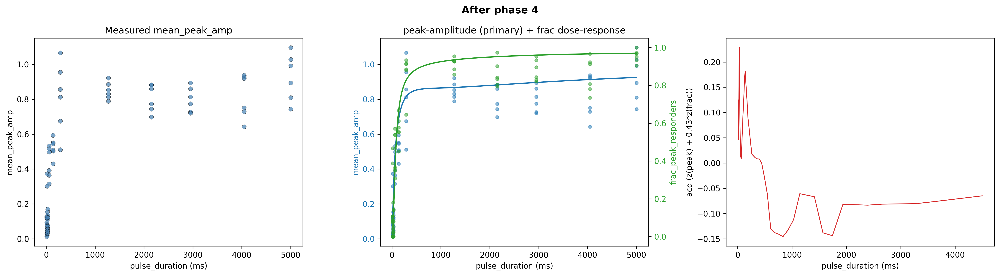

  [v4 convergence] peak-curve RMS change=0.035 (tol 0.05), family='hill', frac half-recruitment dose=125 ms, converged=False

=== ComposedAgent: phase 5/7 ===
[FOVFinderAgent] Phase 4 — selected FOVs:
    C5_0000: 64 cells
    C5_0001: 91 cells
    C5_0002: 91 cells
    C6_0000: 89 cells
    C6_0001: 30 cells
    C6_0002: 35 cells
    C7_0000: 41 cells
    C7_0001: 44 cells
    C7_0002: 86 cells
    C8_0000: 93 cells
    C8_0001: 31 cells
    C8_0002: 64 cells
    C9_0000: 88 cells
    C9_0001: 51 cells
    C9_0002: 67 cells
    C10_0000: 83 cells
    C10_0001: 100 cells
    C10_0002: 37 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+1.00(n=3), exponential=+0.00(n=2), power_law=+0.00(n=2))]
    [auc: obj=0.0098 (prev_finite=0.0182) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'exponential'  (hill=+0.50(n=2), exponential=+0.67(n=3))]
    [frac: obj=0.0415 (prev_fi

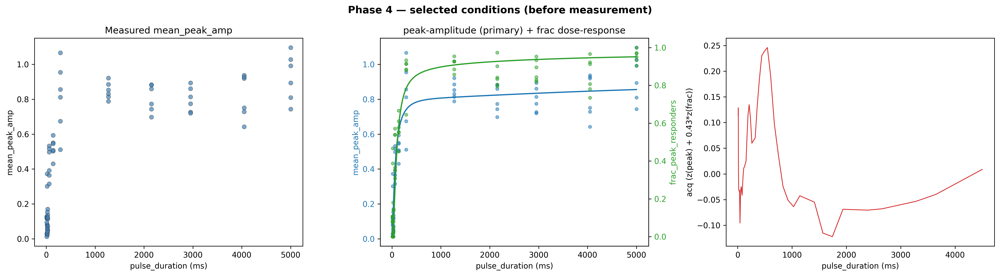

  Created 558 events for phase 4
    Cond 0 (FOVs 72-77): pulse_duration=547ms
    Cond 1 (FOVs 78-83): pulse_duration=399ms
    Cond 2 (FOVs 84-89): pulse_duration=212ms
  optoRTK retry summary: 1/1 recovered after re-read


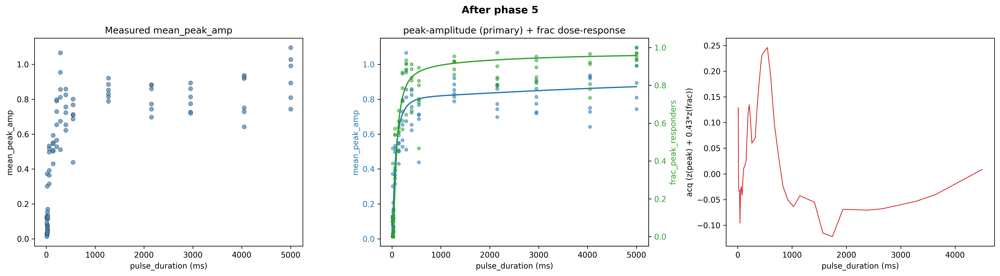

  [v4 convergence] peak-curve RMS change=0.048 (tol 0.05), family='hill', frac half-recruitment dose=139 ms, converged=True

=== ComposedAgent: phase 6/7 ===
[FOVFinderAgent] Phase 5 — selected FOVs:
    C11_0000: 99 cells
    C11_0001: 70 cells
    C11_0002: 30 cells
    C12_0000: 69 cells
    C12_0001: 47 cells
    C12_0002: 58 cells
    D11_0000: 56 cells
    D11_0001: 35 cells
    D11_0002: 35 cells
    D10_0000: 81 cells
    D10_0001: 39 cells
    D10_0002: 62 cells
    D9_0000: 93 cells
    D9_0001: 38 cells
    D9_0002: 31 cells
    D8_0000: 73 cells
    D8_0001: 44 cells
    D8_0002: 51 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+1.00(n=4), exponential=+0.00(n=2), power_law=+0.00(n=2))]
    [auc: obj=0.0103 (prev_finite=0.0098) -> reward=-1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'hill'  (hill=+0.50(n=2), exponential=+0.75(n=4))]
    [frac: obj=0.0315 (prev_fi

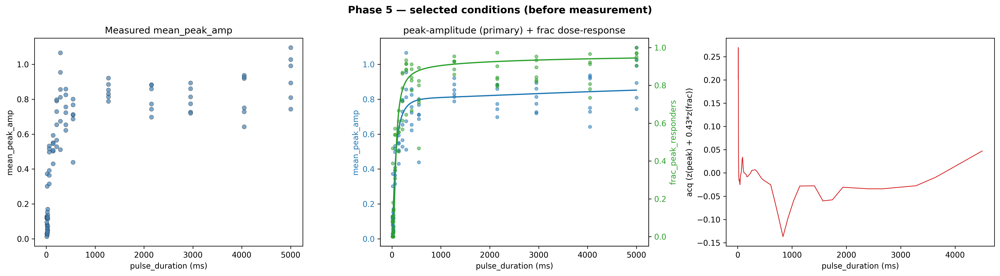

  Created 558 events for phase 5
    Cond 0 (FOVs 90-95): pulse_duration=12ms
    Cond 1 (FOVs 96-101): pulse_duration=11ms
    Cond 2 (FOVs 102-107): pulse_duration=14ms
  optoRTK retry summary: 1/1 recovered after re-read


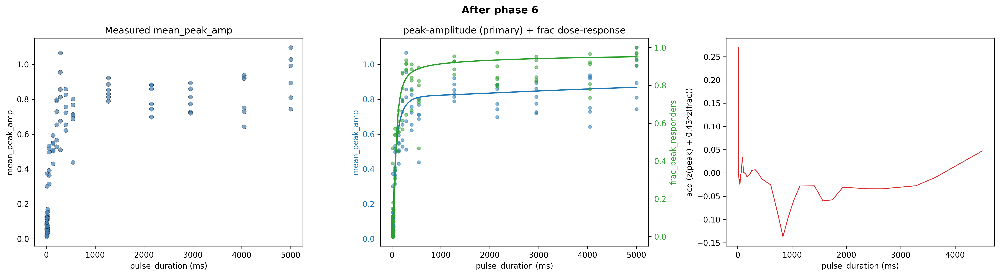

  [v4 convergence] peak-curve RMS change=0.008 (tol 0.05), family='hill', frac half-recruitment dose=113 ms, converged=True

=== ComposedAgent: phase 7/7 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:55: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 6 — selected FOVs:
    D6_0000: 58 cells
    D6_0001: 80 cells
    D6_0002: 47 cells
    D5_0000: 75 cells
    D5_0001: 36 cells
    D5_0002: 39 cells
    D4_0000: 55 cells
    D4_0001: 63 cells
    D4_0002: 93 cells
    A2_0000: 69 cells
    A2_0001: 50 cells
    A2_0002: 35 cells
    A3_0000: 36 cells
    A3_0001: 62 cells
    A3_0002: 30 cells
    A4_0000: 69 cells
    A4_0001: 51 cells
    A4_0002: 57 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+0.60(n=5), exponential=+0.00(n=2), power_law=+0.00(n=2))]
    [auc: obj=0.0069 (prev_finite=0.0103) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'exponential'  (hill=+0.67(n=3), exponential=+0.75(n=4))]
    [frac: obj=0.0279 (prev_finite=0.0315) -> reward=+1]
  AUC-primary acq stats (frac_w=0.43): min=-0.1219, max=0.1023
  [reusing cached two-task GP fits from earlier in this batch]
  AUC-prim

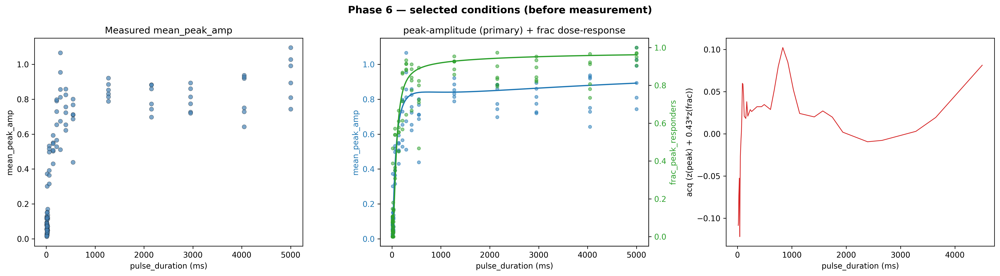

  Created 558 events for phase 6
    Cond 0 (FOVs 108-113): pulse_duration=834ms
    Cond 1 (FOVs 114-119): pulse_duration=4500ms
    Cond 2 (FOVs 120-125): pulse_duration=91ms
  optoRTK retry summary: 1/1 recovered after re-read


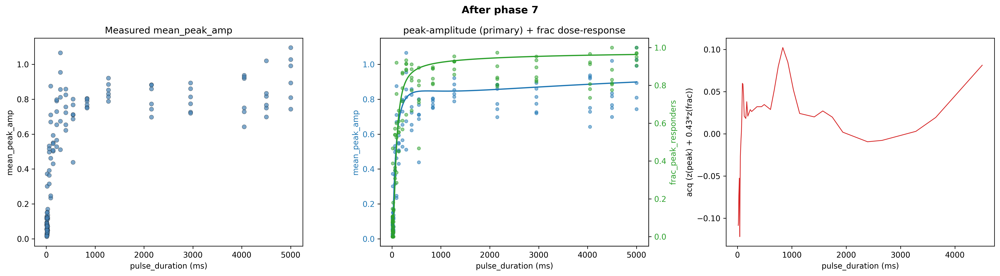

  [v4 convergence] peak-curve RMS change=0.012 (tol 0.05), family='hill', frac half-recruitment dose=125 ms, converged=True
Block 5 done: 126 FOVs, converged-indicator=True
Directory E:\Alex\2026-06-07_bo_erk_dose_response_v6_pitch_power5_power10\tracks created 
  block 10: wells D3..H6 (42 distinct)
POWER BLOCK 10  ->  E:\Alex\2026-06-07_bo_erk_dose_response_v6_pitch_power5_power10
  grid: 60 durations | acq: z(peak) + 0.43*z(frac) + inverse-distance repulsion

=== ComposedAgent: phase 1/7 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:55: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 0 — selected FOVs:
    D3_0000: 73 cells
    D3_0001: 73 cells
    D3_0002: 100 cells
    E2_0000: 82 cells
    E2_0001: 31 cells
    E2_0002: 30 cells
    E3_0000: 67 cells
    E3_0001: 56 cells
    E3_0002: 41 cells
    E4_0000: 67 cells
    E4_0001: 98 cells
    E4_0002: 58 cells
    E5_0000: 60 cells
    E5_0001: 59 cells
    E5_0002: 70 cells
    E7_0000: 57 cells
    E7_0001: 62 cells
    E7_0002: 51 cells
=== Phase 0: initial batch 1/1 ===
  Condition 0: {'pulse_duration': np.float64(16.932702245413264)}
  Condition 1: {'pulse_duration': np.float64(5000.000000000004)}
  Condition 2: {'pulse_duration': np.float64(290.96994901031667)}
  Created 558 events for phase 0
    Cond 0 (FOVs 0-5): pulse_duration=17ms
    Cond 1 (FOVs 6-11): pulse_duration=5000ms
    Cond 2 (FOVs 12-17): pulse_duration=291ms
  optoRTK retry summary: 1/1 recovered after re-read
  [save_model] no model to save (BO has not fit yet)


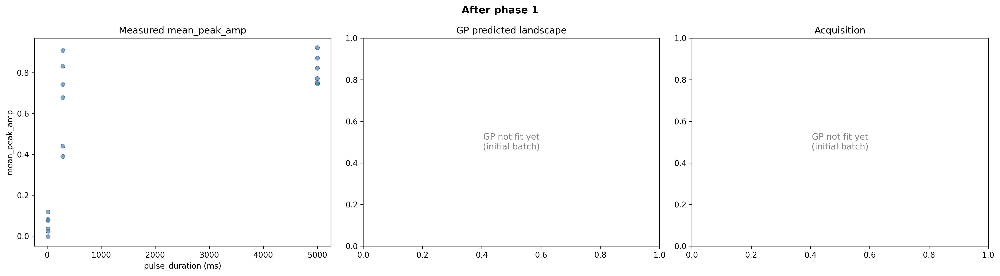


=== ComposedAgent: phase 2/7 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:55: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(
C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:55: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 1 — selected FOVs:
    E9_0000: 36 cells
    E9_0001: 88 cells
    E9_0002: 98 cells
    E10_0000: 59 cells
    E10_0001: 69 cells
    E10_0002: 52 cells
    E11_0000: 66 cells
    E11_0001: 43 cells
    E11_0002: 59 cells
    F11_0000: 99 cells
    F11_0001: 84 cells
    F11_0002: 63 cells
    F10_0000: 53 cells
    F10_0001: 81 cells
    F10_0002: 92 cells
    F9_0000: 51 cells
    F9_0001: 33 cells
    F9_0002: 50 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: warmup phase 1/2 -- fitting all 3 candidates]
      hill: obj=0.0493, log_evidence=-1.079
      exponential: obj=0.0503, log_evidence=+1.535
      power_law: obj=0.0504, log_evidence=-0.441
    [auc: warmup winner='hill', obj=0.0493]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: warmup phase 1/2 -- fitting all 2 candidates]
      hill: obj=0.1438, log_evidence=-10.476
      exponential: obj=0.1544, log_evidence=-9.784
    [frac: warmup wi

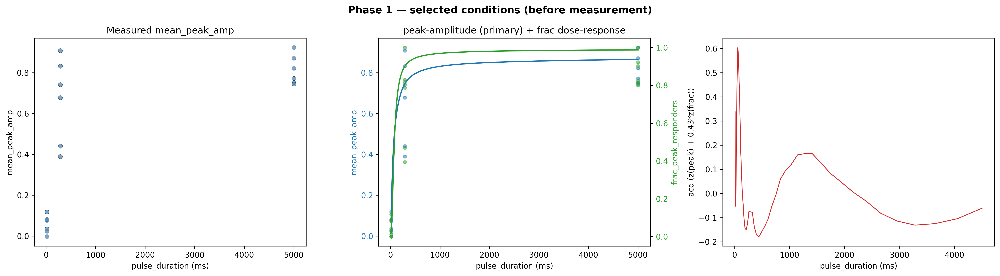

  Created 558 events for phase 1
    Cond 0 (FOVs 18-23): pulse_duration=60ms
    Cond 1 (FOVs 24-29): pulse_duration=10ms
    Cond 2 (FOVs 30-35): pulse_duration=1413ms
  optoRTK retry summary: 1/1 recovered after re-read


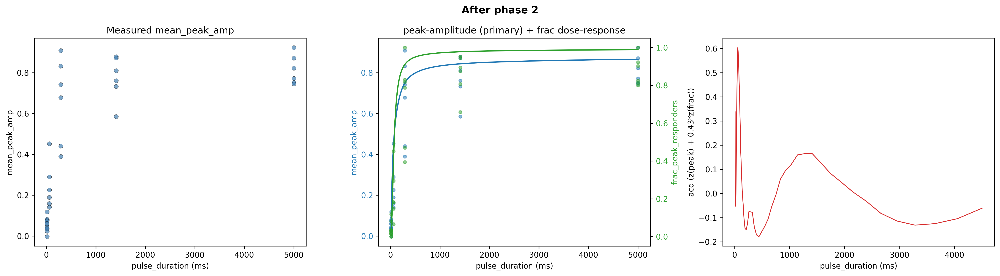

  [v4 convergence] peak-curve RMS change=n/a (tol 0.05), family='hill', frac half-recruitment dose=155 ms, converged=False

=== ComposedAgent: phase 3/7 ===
[FOVFinderAgent] Phase 2 — selected FOVs:
    F8_0000: 35 cells
    F8_0001: 42 cells
    F8_0002: 93 cells
    F7_0000: 34 cells
    F7_0001: 89 cells
    F7_0002: 47 cells
    F6_0000: 93 cells
    F6_0001: 54 cells
    F6_0002: 74 cells
    F5_0000: 73 cells
    F5_0001: 57 cells
    F5_0002: 80 cells
    F4_0000: 95 cells
    F4_0001: 96 cells
    F4_0002: 65 cells
    F3_0000: 85 cells
    F3_0001: 30 cells
    F3_0002: 55 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: warmup phase 2/2 -- fitting all 3 candidates]
      hill: obj=0.0230, log_evidence=+5.763
      exponential: obj=0.0243, log_evidence=+9.011
      power_law: obj=0.0246, log_evidence=+8.177
    [auc: warmup winner='hill', obj=0.0230]
    [auc: WARMUP COMPLETE -- win frequencies: hill=1.00, exponential=0.00, power_law=0.00]
  Fitti

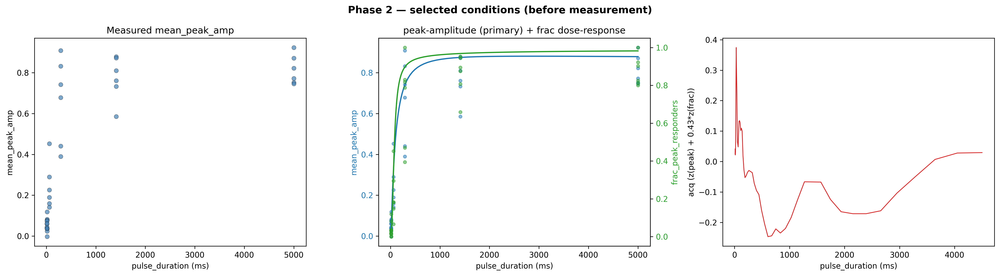

  Created 558 events for phase 2
    Cond 0 (FOVs 36-41): pulse_duration=32ms
    Cond 1 (FOVs 42-47): pulse_duration=125ms
    Cond 2 (FOVs 48-53): pulse_duration=44ms
  optoRTK retry summary: 1/1 recovered after re-read


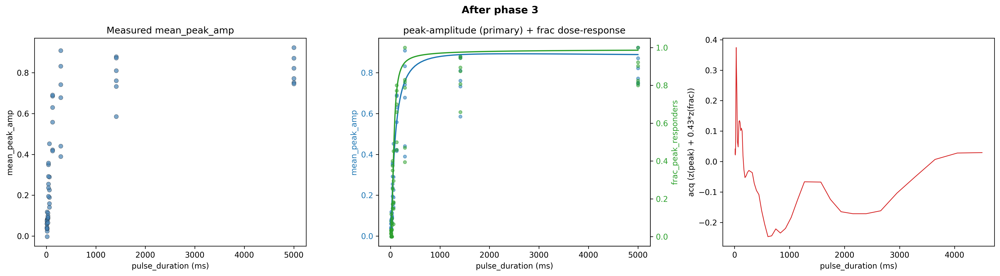

  [v4 convergence] peak-curve RMS change=0.062 (tol 0.05), family='hill', frac half-recruitment dose=113 ms, converged=False

=== ComposedAgent: phase 4/7 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\agents\fov_finder.py:601: UserWarning: Unable to generate 12 non-overlapping points. Only 11 points were found.
  return np.array([(p.x, p.y) for p in rp], dtype=float)


[FOVFinderAgent] Phase 3 — selected FOVs:
    F2_0000: 52 cells
    F2_0001: 34 cells
    F2_0002: 33 cells
    G2_0000: 82 cells
    G2_0001: 54 cells
    G2_0002: 74 cells
    G3_0000: 34 cells
    G3_0001: 45 cells
    G3_0002: 34 cells
    G4_0000: 75 cells
    G4_0001: 32 cells
    G4_0002: 57 cells
    G5_0000: 88 cells
    G5_0001: 56 cells
    G5_0002: 49 cells
    G7_0000: 99 cells
    G7_0001: 35 cells
    G7_0002: 38 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+1.00(n=2), exponential=+0.00(n=2), power_law=+0.00(n=2))]
    [auc: obj=0.0195 (prev_finite=0.0230) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'hill'  (hill=+1.00(n=2), exponential=+0.00(n=2))]
    [frac: obj=0.0555 (prev_finite=0.0774) -> reward=+1]
  AUC-primary acq stats (frac_w=0.43): min=-0.1549, max=0.2997
  [reusing cached two-task GP fits from earlier in this batch]
  AUC-primary acq

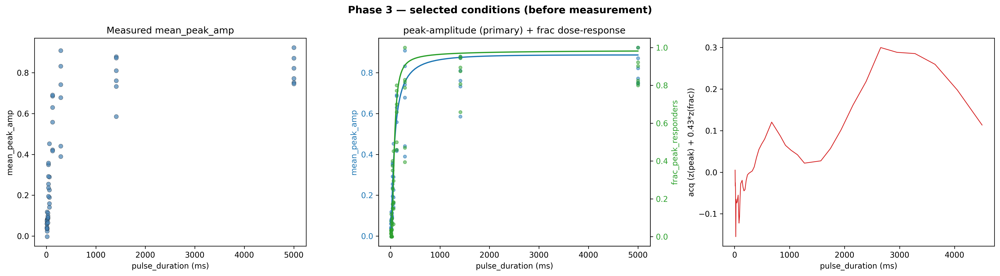

  Created 558 events for phase 3
    Cond 0 (FOVs 54-59): pulse_duration=2658ms
    Cond 1 (FOVs 60-65): pulse_duration=3645ms
    Cond 2 (FOVs 66-71): pulse_duration=676ms
  optoRTK retry summary: 1/1 recovered after re-read


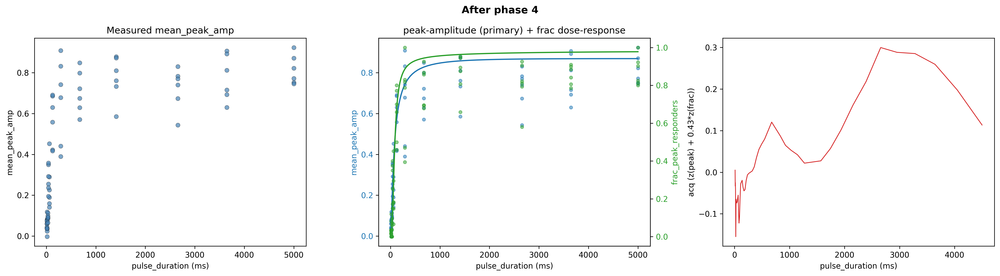

  [v4 convergence] peak-curve RMS change=0.020 (tol 0.05), family='hill', frac half-recruitment dose=125 ms, converged=False

=== ComposedAgent: phase 5/7 ===


no seeds found in get_masks_torch - no masks found.
C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:55: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 4 — selected FOVs:
    G10_0000: 75 cells
    G10_0001: 79 cells
    G10_0002: 33 cells
    G11_0000: 40 cells
    G11_0001: 41 cells
    G11_0002: 82 cells
    G12_0000: 66 cells
    G12_0001: 42 cells
    G12_0002: 63 cells
    H12_0000: 92 cells
    H12_0001: 45 cells
    H12_0002: 83 cells
    H11_0000: 64 cells
    H11_0001: 68 cells
    H11_0002: 92 cells
    H10_0000: 30 cells
    H10_0001: 70 cells
    H10_0002: 75 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+1.00(n=3), exponential=+0.00(n=2), power_law=+0.00(n=2))]
    [auc: obj=0.0161 (prev_finite=0.0195) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'hill'  (hill=+1.00(n=3), exponential=+0.00(n=2))]
    [frac: obj=0.0403 (prev_finite=0.0555) -> reward=+1]
  AUC-primary acq stats (frac_w=0.43): min=-0.2059, max=0.1575
  [reusing cached two-task GP fits from earlier in this batch]

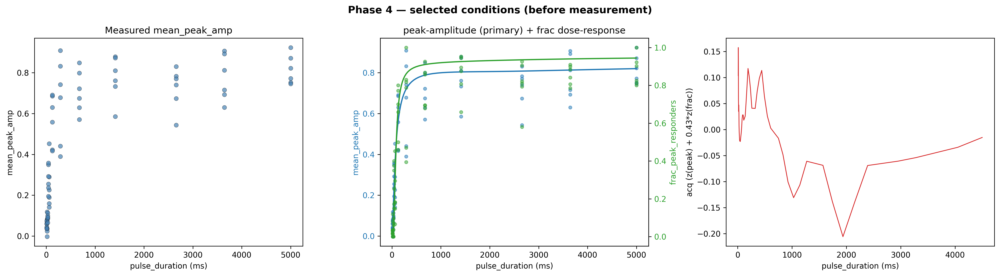

  Created 558 events for phase 4
    Cond 0 (FOVs 72-77): pulse_duration=12ms
    Cond 1 (FOVs 78-83): pulse_duration=191ms
    Cond 2 (FOVs 84-89): pulse_duration=443ms
  optoRTK retry summary: 1/1 recovered after re-read


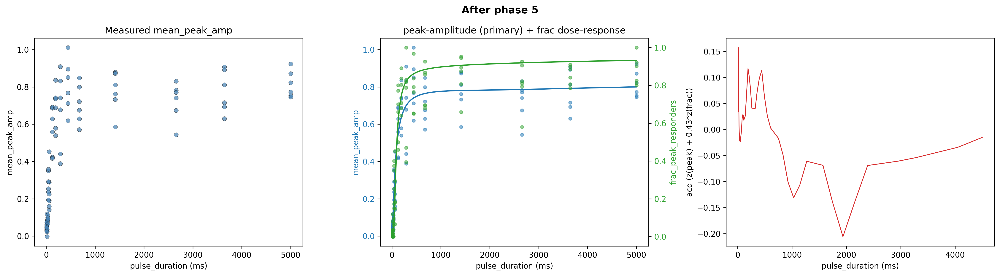

  [v4 convergence] peak-curve RMS change=0.028 (tol 0.05), family='hill', frac half-recruitment dose=113 ms, converged=True

=== ComposedAgent: phase 6/7 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:55: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 5 — selected FOVs:
    H9_0000: 56 cells
    H9_0001: 34 cells
    H9_0002: 33 cells
    H8_0000: 31 cells
    H8_0001: 66 cells
    H8_0002: 78 cells
    H7_0000: 46 cells
    H7_0001: 100 cells
    H7_0002: 40 cells
    H6_0000: 77 cells
    H6_0001: 42 cells
    H6_0002: 38 cells
    D3_0000: 59 cells
    D3_0001: 95 cells
    D3_0002: 30 cells
    D2_0000: 42 cells
    D2_0001: 46 cells
    D2_0002: 31 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+1.00(n=4), exponential=+0.00(n=2), power_law=+0.00(n=2))]
    [auc: obj=0.0138 (prev_finite=0.0161) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'exponential'  (hill=+1.00(n=4), exponential=+0.00(n=2))]
    [frac: obj=0.0409 (prev_finite=0.0403) -> reward=-1]
  AUC-primary acq stats (frac_w=0.43): min=-0.1322, max=0.1591
  [reusing cached two-task GP fits from earlier in this batch]
  AUC-pri

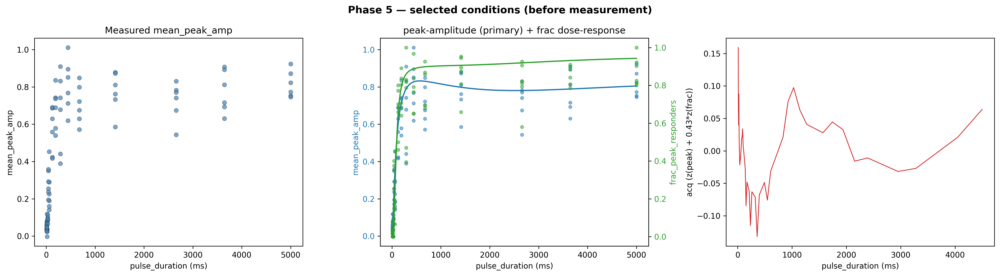

  Created 558 events for phase 5
    Cond 0 (FOVs 90-95): pulse_duration=11ms
    Cond 1 (FOVs 96-101): pulse_duration=1030ms
    Cond 2 (FOVs 102-107): pulse_duration=23ms
  optoRTK retry summary: 1/1 recovered after re-read


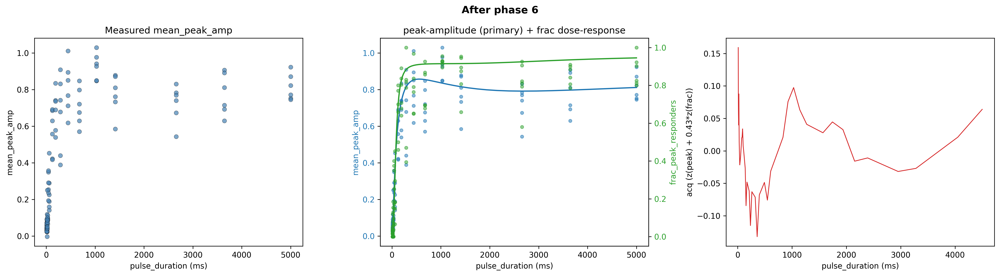

  [v4 convergence] peak-curve RMS change=0.057 (tol 0.05), family='hill', frac half-recruitment dose=101 ms, converged=False

=== ComposedAgent: phase 7/7 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:55: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 6 — selected FOVs:
    E2_0000: 44 cells
    E2_0001: 30 cells
    E2_0002: 60 cells
    E3_0000: 83 cells
    E3_0001: 70 cells
    E3_0002: 47 cells
    E4_0000: 86 cells
    E4_0001: 93 cells
    E4_0002: 44 cells
    E5_0000: 96 cells
    E5_0001: 35 cells
    E5_0002: 71 cells
    E6_0000: 59 cells
    E6_0001: 59 cells
    E6_0002: 33 cells
    E7_0000: 100 cells
    E7_0001: 66 cells
    E7_0002: 80 cells
  Fitting task = 'auc' (column = 'mean_peak_amp', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+1.00(n=5), exponential=+0.00(n=2), power_law=+0.00(n=2))]
    [auc: obj=0.0104 (prev_finite=0.0138) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'hill'  (hill=+1.00(n=4), exponential=-0.33(n=3))]
    [frac: obj=0.0231 (prev_finite=0.0409) -> reward=+1]
  AUC-primary acq stats (frac_w=0.43): min=-0.0853, max=0.1626
  [reusing cached two-task GP fits from earlier in this batch]
  AUC-primary ac

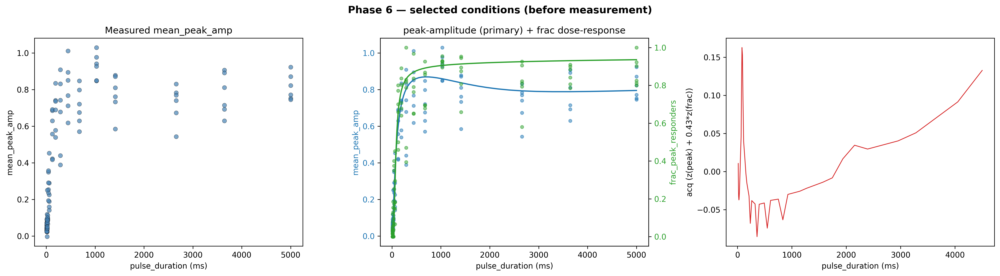

  Created 558 events for phase 6
    Cond 0 (FOVs 108-113): pulse_duration=82ms
    Cond 1 (FOVs 114-119): pulse_duration=4500ms
    Cond 2 (FOVs 120-125): pulse_duration=4050ms
  optoRTK retry summary: 1/1 recovered after re-read


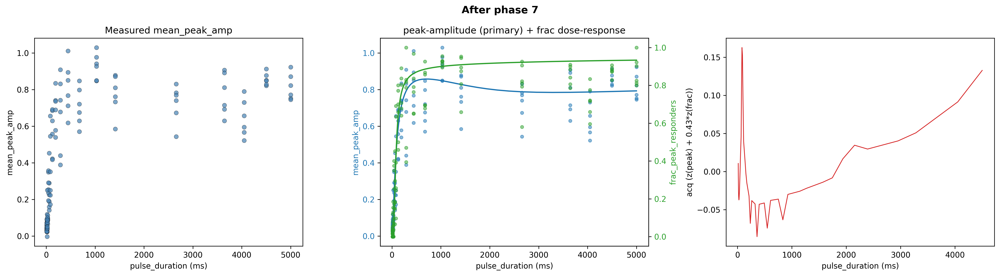

  [v4 convergence] peak-curve RMS change=0.018 (tol 0.05), family='hill', frac half-recruitment dose=113 ms, converged=False
Block 10 done: 126 FOVs, converged-indicator=False


In [8]:
agents = {}
for _power in POWER_LEVELS:
    agents[_power] = run_power_block(_power)
    print(
        f"Block {_power} done: {len(agents[_power].df_results)} FOVs, "
        f"converged-indicator={agents[_power].is_converged}"
    )

## Zero-dose control (0 ms, no stimulation)

A handful of FOVs acquired with `stim_exposure = 0`. The engine now skips the
pulse entirely (no SLM event, no hardware call, no camera-minimum error), so
this is a *true* negative control. It is kept **out** of the BO/GP (a log dose
axis cannot host 0 ms) and overlaid on a symlog axis to anchor the foot of the
sigmoid -- "no light, no ERK response".

> **Dry-run this on the scope before the pitch.** It is the only cell not
> validated offline (it drives a real acquisition through `run_experiment`).

In [10]:
# === Zero-dose control: a few 0 ms FOVs, kept out of the GP =============
from faro.core.data_structures import RTMSequence

N_CONTROL_FOVS = 6
CONTROL_WELLS = WELLS[-2:]  # dedicated wells (BO blocks use the front slice)
control_data = {}  # {power: np.array of per-FOV mean_peak_amp at 0 ms}


def run_zero_dose_control(power):
    path = block_path(power) + "_ctrl0ms"
    os.makedirs(path, exist_ok=True)
    pipeline, writer = make_pipeline_and_writer(path)
    finder = FOVFinderAgent(
        microscope=mic,
        well_plate_plan=PLATE_CALIBRATION_PATH,
        wells=CONTROL_WELLS,
        wells_per_phase=len(CONTROL_WELLS),
        fovs_per_well=max(1, N_CONTROL_FOVS // len(CONTROL_WELLS)),
        n_candidates_per_well=FOV_N_CANDIDATES_PER_WELL,
        border_um=FOV_BORDER_UM,
        min_distance_um=FOV_MIN_DISTANCE_UM,
        min_cells=30,
        max_cells=100,
        imaging_channels=(imaging_channels[0],),
        segmentator=segmentator,
        seg_channel_index=0,
        random_seed=None,
        selection_mode="farthest_point",
        cycle_wells=False,
        verbose=False,
        z=None,
    )
    positions = finder.run()
    acq = RTMSequence(
        time_plan={"interval": TIME_BETWEEN_TIMESTEPS, "loops": N_FRAMES},
        stage_positions=positions,
        channels=imaging_channels,
        stim_channels=(make_stim_channel(power),),
        stim_frames=frozenset({STIM_FRAME}),
        stim_exposure=0.0,  # <- engine skips => true no-stim
        ref_channels=(optocheck_channel,),
        ref_frames=frozenset({N_FRAMES - 1}),
        rtm_metadata={
            "phase_name": "zero_dose_control",
            "phase_id": 0,
            "pulse_duration": 0.0,
        },
    )
    ctrl = Controller(mic, pipeline, writer=writer, agent=None)
    ctrl.run_experiment(list(acq))  # validate passes (no stim channel)
    utils.generate_exp_data_from_tracks(path)
    return path


def control_peak_amps(
    path,
    max_baseline_cnr=0.95,
    min_track_fraction=0.8,
    min_valid_cells=10,
    resp_window=12,
):
    """Per-FOV mean_peak_amp at 0 ms, mirroring the agent's _extract logic."""
    import glob

    obs_start = STIM_FRAME + 1
    obs_end = min(obs_start + resp_window, N_FRAMES)
    min_frames = int(min_track_fraction * N_FRAMES)
    out = []
    for f in glob.glob(os.path.join(path, "tracks", "*.parquet")):
        d = pd.read_parquet(f)
        cc = "cnr" if "cnr" in d else ("cnr_median" if "cnr_median" in d else None)
        if cc is None:
            continue
        fpc = d.groupby("particle")["fov_timestep"].nunique()
        peaks = []
        for pid, g in d.groupby("particle"):
            if fpc.get(pid, 0) < min_frames:
                continue
            g = g.sort_values("fov_timestep")
            bl = g[g["fov_timestep"] < N_FRAMES_BASELINE]
            if bl.empty:
                continue
            b = float(bl[cc].mean())
            if not (b < max_baseline_cnr):
                continue
            obs = g[(g["fov_timestep"] >= obs_start) & (g["fov_timestep"] < obs_end)]
            if len(obs) < 3:
                continue
            peaks.append(float((obs[cc].values - b).max()))
        if len(peaks) >= min_valid_cells:
            out.append(float(np.mean(peaks)))
    return np.array(out)


for _power in POWER_LEVELS:
    _p = run_zero_dose_control(_power)
    control_data[_power] = control_peak_amps(_p)
    _ca = control_data[_power]
    print(
        f"control power {_power}: {len(_ca)} FOVs, "
        + (f"mean_peak_amp(0 ms) = {np.nanmean(_ca):.3f}" if len(_ca) else "no FOVs")
    )

Directory E:\Alex\2026-06-07_bo_erk_dose_response_v6_pitch_power5_power5_ctrl0ms\tracks already exists
[FOVFinderAgent] Phase 0 — selected FOVs:
    H3_0000: 43 cells
    H3_0001: 90 cells
    H3_0002: 34 cells
    H2_0000: 48 cells
    H2_0001: 33 cells
    H2_0002: 217 cells (rejected: above_max_cells)
control power 5: 6 FOVs, mean_peak_amp(0 ms) = 0.032
Directory E:\Alex\2026-06-07_bo_erk_dose_response_v6_pitch_power5_power10_ctrl0ms\tracks created 
[FOVFinderAgent] Phase 0 — selected FOVs:
    H3_0000: 40 cells
    H3_0001: 88 cells
    H3_0002: 50 cells
    H2_0000: 92 cells
    H2_0001: 50 cells
    H2_0002: 34 cells
control power 10: 6 FOVs, mean_peak_amp(0 ms) = 0.054


## Analysis 1 -- which model family won the peak task, per power block

The headline scientific output: for each power, did the peak dose-response
select **hill** (cooperative-saturating, has an EC50), **exponential**
(hyperbolic-saturating), or **power_law** (non-saturating)? The selected family
*is* the answer to "does peak ERK amplitude saturate with duration at this
power?".

In [11]:
rows = []
for power, agent in agents.items():
    if agent.df_results is None or agent.df_results.empty:
        continue
    st = agent._task_state["auc"]  # key "auc" carries the peak task in v4
    fam = st.get("selected_hypothesis")
    record = st["record"]
    cands = list(agent.candidate_hypotheses_by_task["auc"])
    rewards = {cands[i]: float(record[i, 1]) for i in range(len(cands))}
    rows.append(
        dict(
            power=power,
            selected_peak_family=fam,
            n_fovs=len(agent.df_results),
            **rewards,
        )
    )
summary = pd.DataFrame(rows)
print(summary.to_string(index=False))

 power selected_peak_family  n_fovs     hill  exponential  power_law
     5                 hill     126 0.666667          0.0        0.0
    10                 hill     126 1.000000          0.0        0.0


## Analysis 2 -- per-power peak dose-response, stratified by optoRTK expression

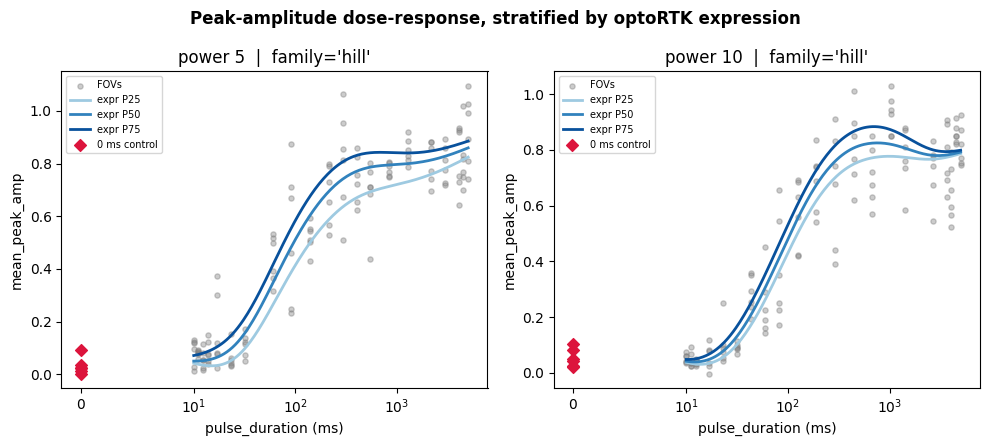

In [12]:
import gpax.utils


def predict_peak_stratified(agent, expr_percentiles=(25, 50, 75), n_dose=200):
    """Peak-amplitude GP curve over the dose grid at low/med/high optoRTK
    expression (baseline_cnr fixed at its median). Returns (doses, {pct: curve})."""
    if "auc" not in agent._gp_models_by_task or agent.df_results is None:
        return None, None
    df = agent.df_results
    gp = agent._gp_models_by_task["auc"]
    y_scaler = agent._y_scalers_by_task["auc"]
    cov_names = [c.name for c in agent.bo_covariates]
    j_expr = cov_names.index("optortk_expression")
    j_base = cov_names.index("baseline_cnr")
    base_med = float(np.median(df["baseline_cnr"].to_numpy(float)))
    expr_vals = df["optortk_expression"].to_numpy(float)
    expr_vals = expr_vals[np.isfinite(expr_vals) & (expr_vals > 0)]

    doses = np.geomspace(DURATION_BOUNDS[0], DURATION_BOUNDS[1], n_dose)
    _, kp = gpax.utils.get_keys(0)
    curves = {}
    for pct in expr_percentiles:
        e = float(np.percentile(expr_vals, pct))
        cov = np.zeros((n_dose, len(cov_names)))
        cov[:, j_expr] = e
        cov[:, j_base] = base_med
        x_raw = np.column_stack([doses, cov])
        x_scaled = agent._x_scaler.transform(x_raw)
        mean_s, _ = gp.predict_in_batches(
            kp, jnp.asarray(x_scaled), batch_size=50, n=8, noiseless=True
        )
        curves[pct] = y_scaler.inverse_transform(
            np.asarray(mean_s).reshape(-1, 1)
        ).ravel()
    return doses, curves


n = len(agents)
fig, axes = plt.subplots(1, n, figsize=(5 * n, 4.5), squeeze=False)
shades = {25: "#9ecae1", 50: "#3182bd", 75: "#08519c"}
for ax, (power, agent) in zip(axes[0], agents.items()):
    if agent.df_results is None or agent.df_results.empty:
        ax.text(
            0.5,
            0.5,
            f"power {power}: no data",
            ha="center",
            va="center",
            transform=ax.transAxes,
        )
        continue
    ax.scatter(
        agent.df_results["pulse_duration"],
        agent.df_results["mean_peak_amp"],
        s=14,
        c="gray",
        alpha=0.4,
        label="FOVs",
    )
    doses, curves = predict_peak_stratified(agent)
    if curves is not None:
        for pct, curve in curves.items():
            ax.plot(doses, curve, color=shades[pct], lw=2, label=f"expr P{pct}")
    fam = agent._task_state["auc"].get("selected_hypothesis")
    ax.set_title(f"power {power}  |  family={fam!r}")
    if (
        "control_data" in globals()
        and power in control_data
        and len(control_data[power])
    ):
        ca = control_data[power]
        ax.scatter(
            np.zeros_like(ca),
            ca,
            s=36,
            c="crimson",
            marker="D",
            zorder=5,
            label="0 ms control",
        )
    ax.set_xlabel("pulse_duration (ms)")
    ax.set_ylabel("mean_peak_amp")
    ax.set_xscale("symlog", linthresh=DURATION_BOUNDS[0])  # show 0 ms control
    ax.legend(fontsize=7)
fig.suptitle(
    "Peak-amplitude dose-response, stratified by optoRTK expression",
    fontsize=12,
    fontweight="bold",
)
plt.tight_layout()
plt.show()

## Analysis 3 -- convergence indicator (reported, not enforced)

Per phase: the peak-curve relative-RMS change (should fall below the dashed
tolerance and stay there) and the `frac` half-recruitment dose (the one EC50
that is always identifiable, since a recruited fraction must saturate at 1).
The run still used the full FOV budget regardless.

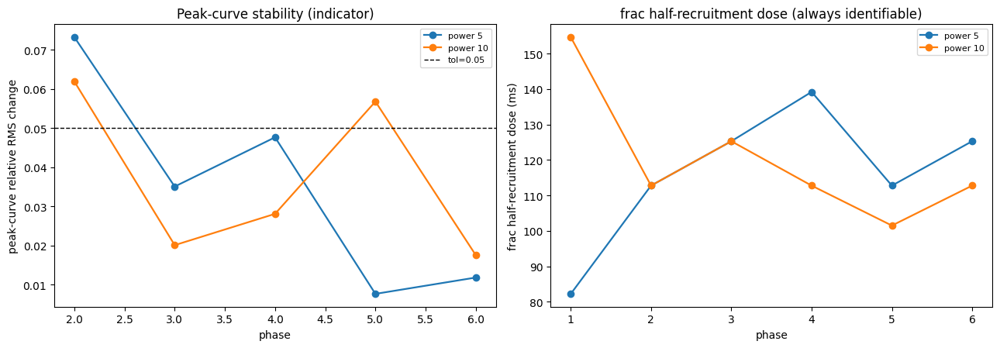

power 5: family='hill', last peak-RMS=0.012, converged-indicator=True
power 10: family='hill', last peak-RMS=0.018, converged-indicator=False


In [13]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.6))
for power, agent in agents.items():
    rep = agent.convergence_report()
    rms = rep["peak_rms_history"]
    hd = rep["frac_halfdose_history"]
    ph = np.arange(1, len(rms) + 1)
    axes[0].plot(ph, rms, "o-", lw=1.6, label=f"power {power}")
    axes[1].plot(np.arange(1, len(hd) + 1), hd, "o-", lw=1.6, label=f"power {power}")
_tol = list(agents.values())[0].stop_rms_tol if agents else 0.05
axes[0].axhline(_tol, color="k", ls="--", lw=1, label=f"tol={_tol}")
axes[0].set_xlabel("phase")
axes[0].set_ylabel("peak-curve relative RMS change")
axes[0].set_title("Peak-curve stability (indicator)")
axes[0].legend(fontsize=8)
axes[1].set_xlabel("phase")
axes[1].set_ylabel("frac half-recruitment dose (ms)")
axes[1].set_title("frac half-recruitment dose (always identifiable)")
axes[1].legend(fontsize=8)
plt.tight_layout()
plt.show()

for power, agent in agents.items():
    rep = agent.convergence_report()
    last_rms = rep["peak_rms_history"][-1] if rep["peak_rms_history"] else float("nan")
    fam = rep["selected_family_history"][-1] if rep["selected_family_history"] else None
    print(
        f"power {power}: family={fam!r}, last peak-RMS={last_rms:.3f}, "
        f"converged-indicator={rep['is_converged']}"
    )

## Analysis 4 -- cross-power comparison + reciprocity check

Overlay the median-expression peak curves for all powers (left). Higher power
should lift and/or left-shift the curve. Right: the same curves replotted
against **total light = duration x power** -- if the curves collapse onto one,
reciprocity (Bunsen-Roscoe) holds and a light-budget axis is justified; if they
stay separate, power and duration are *not* interchangeable and blocking was the
right call.

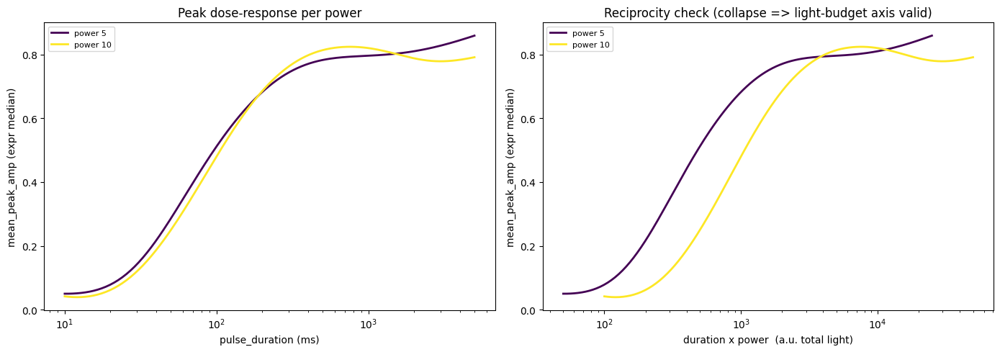

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
cmap = plt.get_cmap("viridis")
powers_sorted = sorted(agents)
for i, power in enumerate(powers_sorted):
    agent = agents[power]
    if agent.df_results is None or agent.df_results.empty:
        continue
    doses, curves = predict_peak_stratified(agent, expr_percentiles=(50,))
    if curves is None:
        continue
    c = cmap(i / max(1, len(powers_sorted) - 1))
    axes[0].plot(doses, curves[50], color=c, lw=2, label=f"power {power}")
    axes[1].plot(doses * power, curves[50], color=c, lw=2, label=f"power {power}")
axes[0].set_xlabel("pulse_duration (ms)")
axes[0].set_ylabel("mean_peak_amp (expr median)")
axes[0].set_xscale("log")
axes[0].set_title("Peak dose-response per power")
axes[0].legend(fontsize=8)
axes[1].set_xlabel("duration x power  (a.u. total light)")
axes[1].set_ylabel("mean_peak_amp (expr median)")
axes[1].set_title("Reciprocity check (collapse => light-budget axis valid)")
axes[1].set_xscale("log")
axes[1].legend(fontsize=8)
plt.tight_layout()
plt.show()

## EC50 posterior with credible intervals (the money slide)

For each block we report the saturating-curve summary two ways:

* **EC50 (full GP curve)** -- the half-max dose read from the fitted GP
  posterior (the curve that actually tracks the data). This is the number to
  quote.
* **EC50 / Vmax (Hill backbone)** -- from the in-GP Hill mean-function
  posterior (`hill_k`, `hill_vmax`). These describe the *parametric backbone*;
  the GP residual corrects it, so read them as the model's structural prior on
  shape, not the final fit.

The selected family (`hill` vs `power_law`) is the hypothesis-test result: a
saturating family winning over `power_law` *is* the statement "peak ERK
amplitude saturates with pulse duration".

In [ ]:
# === EC50 / Vmax posteriors with 95% credible intervals ================
import glob, joblib


def _latest_model(path):
    fs = sorted(glob.glob(os.path.join(path, "models", "bo_model_iter_*.joblib")))
    return joblib.load(fs[-1]) if fs else None


def hill_param_posterior(m):
    """EC50/Vmax posteriors from the in-GP Hill backbone (scaled -> real)."""
    s = m["model_state"]["samples"]
    xs = m["x_scaler"]
    ys = m["y_scaler"]
    if not all(k in s for k in ("hill_k", "hill_vmax")):
        return None
    hk = np.asarray(s["hill_k"])
    hv = np.asarray(s["hill_vmax"])
    x0m = float(np.asarray(xs.mean_)[0])
    x0s = float(np.asarray(xs.std_)[0])
    log0 = bool(xs.log_scale[0]) if xs.log_scale is not None else False
    ym = float(np.asarray(ys.mean_).ravel()[0])
    ysd = float(np.asarray(ys.std_).ravel()[0])
    ec50 = np.exp((hk - 1) * x0s + x0m) if log0 else (hk - 1) * x0s + x0m
    vmax = hv * ysd + ym
    pct = lambda a: np.percentile(a, [2.5, 50, 97.5])
    return dict(ec50=pct(ec50), vmax=pct(vmax))


for power, agent in agents.items():
    fam = agent._task_state["auc"].get("selected_hypothesis")
    print(
        f"=== power {power}: selected peak family = {fam!r} "
        f"(power_law rejected => peak amplitude saturates) ==="
    )
    # (1) data-faithful EC50 from the full GP posterior curve
    doses, curves = predict_peak_stratified(agent, expr_percentiles=(50,))
    if curves is not None:
        c = curves[50]
        half = 0.5 * (np.nanmin(c) + np.nanmax(c))
        i = int(np.argmin(np.abs(c - half)))
        print(
            f"  EC50 (full GP curve)  = {doses[i]:6.0f} ms   "
            f"[plateau {np.nanmax(c):.2f} dCNR]"
        )
    # (2) parametric backbone posterior with CIs
    m = _latest_model(block_path(power))
    hp = hill_param_posterior(m) if m is not None else None
    if hp:
        e = hp["ec50"]
        v = hp["vmax"]
        print(
            f"  EC50 (Hill backbone)  = {e[1]:6.0f} ms   (95% CI {e[0]:.0f}-{e[2]:.0f})"
        )
        print(
            f"  Vmax (Hill backbone)  = {v[1]:6.2f} dCNR (95% CI {v[0]:.2f}-{v[2]:.2f})"
        )
    if (
        "control_data" in globals()
        and power in control_data
        and len(control_data[power])
    ):
        print(
            f"  0 ms control          = {np.nanmean(control_data[power]):.3f} dCNR "
            f"(noise floor, n={len(control_data[power])} FOVs)"
        )